In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import sklearn

red = pd.read_csv("C:\\Users\\Alex\\Desktop\\Projects\\Wine Quality\\winequality-red.csv", delimiter = ";")
red['wine'] = "red"
white = pd.read_csv("C:\\Users\\Alex\\Desktop\\Projects\\Wine Quality\\winequality-white.csv", delimiter = ";")
white['wine'] = "white"


df = red.append(white)
df["wine"].replace({"red": "0", "white": "1"}, inplace=True) #replace string values with int
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


In [2]:
df.duplicated().sum()

1177

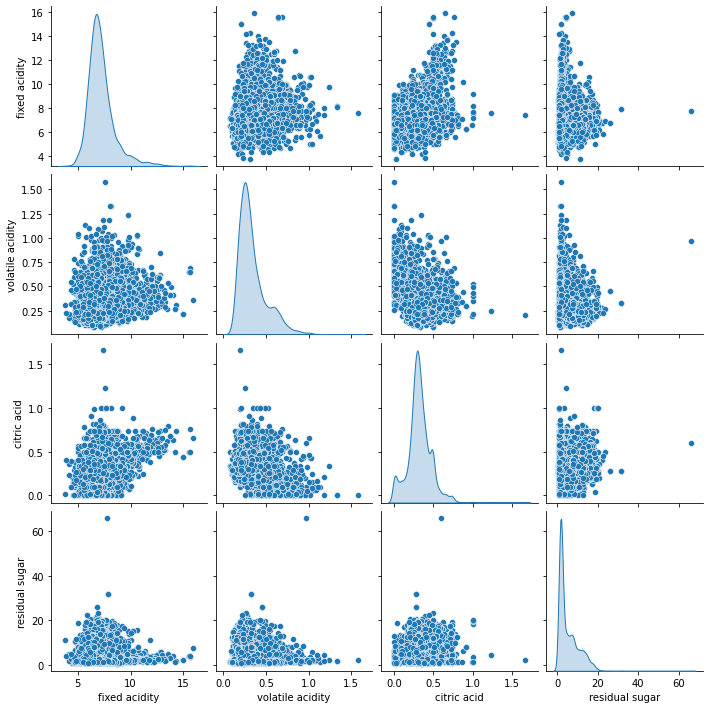

In [2]:
import seaborn as sns

#quick look at the joint distribution of a few pairs of columns
sns.pairplot(df[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar']], diag_kind='kde')

<AxesSubplot:>

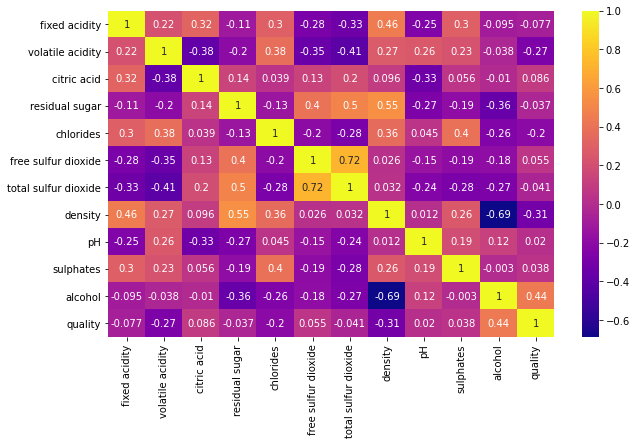

In [3]:
#df.isna().sum()

#correlation of each column
fig,ax = plt.subplots(figsize = (10,6))
sns.heatmap(df.corr(),cmap = 'plasma', annot= True)   #holy fk this looks good, can I further make it look better? maybe change fonts

In [ ]:
#correlation of dependent variable with the explanatory ones

df.corr()['quality'][:-1].sort_values().plot(kind = 'barh',figsize = (13,10), colormap = 'plasma')

In [ ]:
#Check the distribution of the quality column

from matplotlib.ticker import StrMethodFormatter

    
ax = df.hist(column='quality', by='wine', bins=5, grid=False, figsize=(10,12), layout=(3,1), sharex=True, color='#57C0F5', zorder=2, rwidth=0.9)

for i,x in enumerate(ax):

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Set x-axis label
    x.set_xlabel("Wine Quality", labelpad=20, weight='bold', size=12)
    x.tick_params(axis='x', rotation=0)


Looks like there is no red wine with a quality over 8, and most of the values are situated between 5 and 7. Is there bias here?
In the case of white wine, the distribution is skewed to the right (mean will be lower than median). Also, there are more white wine cases than red wine cases.

In [10]:
## How to optimize hyper-parameters of a DecisionTree model using Grid Search in Python ?
def DecTreeOptimizer():
    print('**Optimizing hyper-parameters of a Decision Tree model using Grid Search in Python**\n')


    # importing libraries
    from sklearn import decomposition, datasets
    from sklearn import tree
    from sklearn.pipeline import Pipeline
    from sklearn.model_selection import GridSearchCV
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import classification_report, confusion_matrix
    from sklearn.tree import DecisionTreeClassifier
    X = df.drop(['quality'], axis=1)
    y = df.quality

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

    # Creating an standardscaler object
    std_slc = StandardScaler()

    # Creating a pca object
    pca = decomposition.PCA()

    # Creating a DecisionTreeClassifier
    dec_tree = tree.DecisionTreeClassifier()

    # Creating a pipeline of three steps. First, standardizing the data.
    # Second, tranforming the data with PCA.
    # Third, training a Decision Tree Classifier on the data.
    pipe = Pipeline(steps=[('std_slc', std_slc),
                           ('pca', pca),
                           ('dec_tree', dec_tree)])

    # Creating Parameter Space
    # Creating a list of a sequence of integers from 1 to 30 (the number of features in X + 1)
    n_components = list(range(1,X.shape[1]+1,1))

    # Creating lists of parameter for Decision Tree Classifier
    criterion = ['gini', 'entropy']
    max_depth = [2,4,6,8,10,12]

    # Creating a dictionary of all the parameter options 
    # Note that we can access the parameters of steps of a pipeline by using '__’
    parameters = dict(pca__n_components=n_components,
                      dec_tree__criterion=criterion,
                      dec_tree__max_depth=max_depth)

    # Conducting Parameter Optimization With Pipeline
    # Creating a grid search object
    clf_GS = GridSearchCV(pipe, parameters)

    # Fitting the grid search
    clf_GS.fit(X_train, y_train)

    y_pred = clf_GS.predict(X_test)
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    # Viewing The Best Parameters
    #print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
    #print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
    #print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
    #print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])
    return clf_GS.best_score_
   
DecTreeOptimizer(X = )




**Optimizing hyper-parameters of a Decision Tree model using Grid Search in Python**



C:\Users\Alex\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


[[  0   1   2   1   0   0   0]
 [  1   3  25  16   3   0   0]
 [  1  10 252 155  15   2   0]
 [  0  13 128 353  80   3   0]
 [  0   2  14  69 106  12   0]
 [  1   0   3  13   9   6   0]
 [  0   0   0   0   1   0   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         4
           4       0.10      0.06      0.08        48
           5       0.59      0.58      0.59       435
           6       0.58      0.61      0.60       577
           7       0.50      0.52      0.51       203
           8       0.26      0.19      0.22        32
           9       0.00      0.00      0.00         1

    accuracy                           0.55      1300
   macro avg       0.29      0.28      0.28      1300
weighted avg       0.54      0.55      0.55      1300



C:\Users\Alex\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Alex\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Alex\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

GridSearchCV(estimator=Pipeline(steps=[('std_slc', StandardScaler()),
                                       ('pca', PCA()),
                                       ('dec_tree', DecisionTreeClassifier())]),
             param_grid={'dec_tree__criterion': ['gini', 'entropy'],
                         'dec_tree__max_depth': [2, 4, 6, 8, 10, 12],
                         'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11, 12]})

In [11]:
clf_GS.best_estimator_

NameError: name 'clf_GS' is not defined

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

clf = DecisionTreeClassifier(max_depth = 12, criterion = 'gini')

y_pred = clf.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
# Select the features and the label then split data into training/testing

from sklearn.model_selection import train_test_split



X = df.drop(['quality'], axis=1)
y = df.quality

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

print(f"Nr. of training examples: {X_train.shape[0]}")
print(f"Nr. of testing examples: {X_test.shape[0]}")




In [ ]:
# Build decision tree

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth = 4, criterion = 'entropy')

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)


In [ ]:
# Model Accuracy, how often is the classifier correct?
from sklearn.metrics import classification_report, confusion_matrix


print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
#This was just a first try. What if we use cross-validation to "qualify" the model, i.e choose the max depth?
#It helps to loop through predefined hyperparameters and fit your estimator (model) on your training set. 

from sklearn import tree
from sklearn.model_selection import GridSearchCV


parameters = {'max_depth':range(2,20),
             'min_samples_leaf':range(5,100)}
clf = GridSearchCV(tree.DecisionTreeClassifier(), parameters, n_jobs=4)
clf.fit(X=X, y=y)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 